In [1]:
# %%javascript
# IPython.OutputArea.prototype._should_scroll = function(lines) {
#     return false;
# }

In [2]:
import numpy as np
import cv2
#import matplotlib
#matplotlib.use('TkAgg')
#import matplotlib.pyplot as plt
#import matplotlib
#matplotlib.use('Qt4Agg')
#from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
%matplotlib qt
import time


# 1.Camera Calibration
* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

I plotted the 20 chessboard images to be used for calibration. Eighteen of twenty had a shape of 720 by 1280, while the other two had a shape of 721 by 1281.  Chessboards are of various sizes are located in places of the image.

In [3]:
# make a list of calibration images
def plot_cb(img, fname, display=True):

    print('image shape = ',fname, img.shape)
    if display==True:
        fig, (ax1) = plt.subplots(1, 1, figsize=(6,4))
        ax1.imshow(img)
        ax1.set_title(fname)

    return None

number of chessboard images =  20
image shape =  ./camera_cal\calibration1.jpg (720, 1280, 3)
image shape =  ./camera_cal\calibration10.jpg (720, 1280, 3)
image shape =  ./camera_cal\calibration11.jpg (720, 1280, 3)
image shape =  ./camera_cal\calibration12.jpg (720, 1280, 3)
image shape =  ./camera_cal\calibration13.jpg (720, 1280, 3)
image shape =  ./camera_cal\calibration14.jpg (720, 1280, 3)
image shape =  ./camera_cal\calibration15.jpg (721, 1281, 3)
image shape =  ./camera_cal\calibration16.jpg (720, 1280, 3)
image shape =  ./camera_cal\calibration17.jpg (720, 1280, 3)
image shape =  ./camera_cal\calibration18.jpg (720, 1280, 3)
image shape =  ./camera_cal\calibration19.jpg (720, 1280, 3)
image shape =  ./camera_cal\calibration2.jpg (720, 1280, 3)
image shape =  ./camera_cal\calibration20.jpg (720, 1280, 3)
image shape =  ./camera_cal\calibration3.jpg (720, 1280, 3)
image shape =  ./camera_cal\calibration4.jpg (720, 1280, 3)
image shape =  ./camera_cal\calibration5.jpg (720, 1280

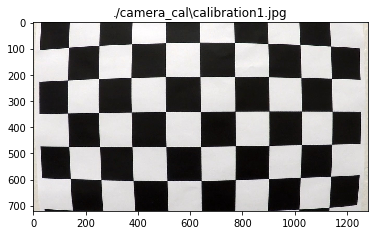

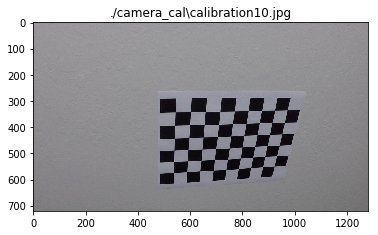

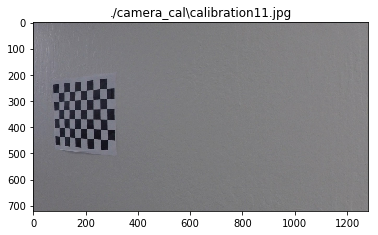

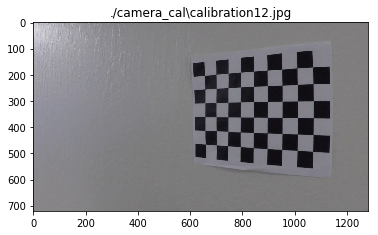

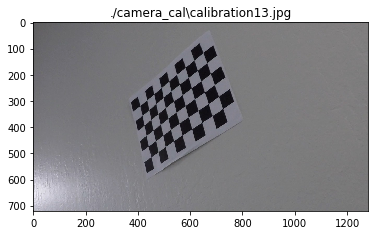

...

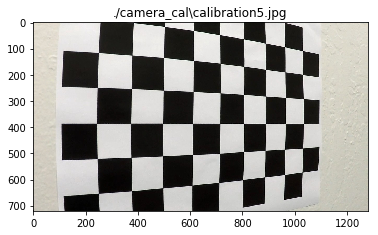

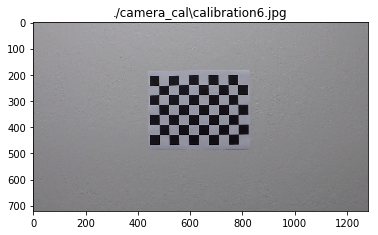

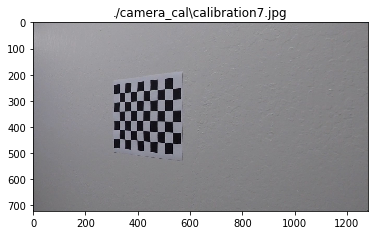

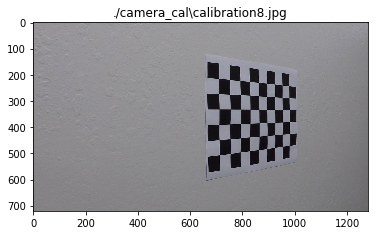

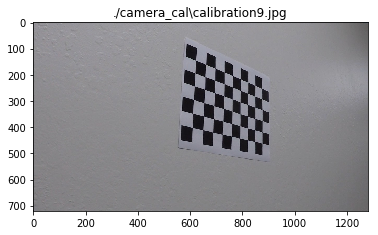

In [4]:
fnames_cb_images = glob.glob('./camera_cal/calibration*.jpg')
print('number of chessboard images = ',len(fnames_cb_images))

for fname in fnames_cb_images:
    img = mpimg.imread(fname)
    plot_cb(img, fname, display=True)

To calibrate the camera, I first found the corners of each chessboard.  There were 9 points across columns and 6 points up and down rows.  Three of the images (images 1, 4, and 5) had chessboard corners out of the images, thus corners were not drawn for these images.

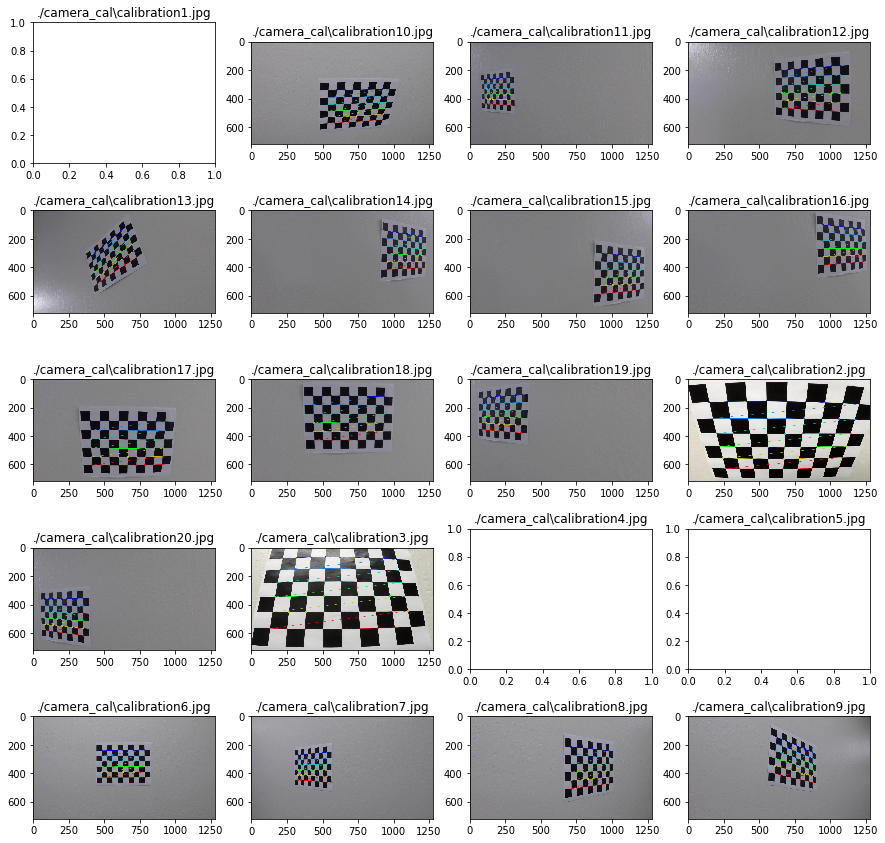

In [5]:
def draw_corners_cb(fnames, nx, ny):
    # Arrays to store object points and image points from all the images
    objpoints = [] # 3D points in real world space
    imgpoints = [] # 2D points in image plane

    # Prepare obejct points, like (0,0,0), (1,0,0), (2,0,0) ..., (7,5,0)
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2) #x, y coordinates

    fig=plt.figure(figsize=(15, 15))
    i = 0

    columns = 4
    rows = len(fnames) / columns

    
    for fname in fnames:
        i += 1
        # read in each image
        img = mpimg.imread(fname)

        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

        axis = fig.add_subplot(rows,columns,i)
        axis.set_title(fname)   

        # If corners found, add points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
    
            # Draw and display the corners
            cv2.drawChessboardCorners(img, (nx, ny), corners, ret)            
            plt.imshow(img)

    plt.show()

    return objpoints, imgpoints

objpoints_cb, imgpoints_cb  = draw_corners_cb(fnames_cb_images, 9, 6)


Finally, images are calibrated using calibrateCamera function and undistorted images are plotted versus the original image.

In [6]:
def undistort(img, objpoints, imgpoints, display=True):
    # use the object and image points to caliberate the camera and compute the 
    # camera matrix and distortion coefficients


    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)

    if display==True:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(6,4))
        ax1.imshow(img)
        ax1.set_title(fname)
        ax2.imshow(undist)
        ax2.set_title('Undistorted')

    return undist

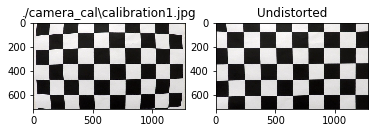

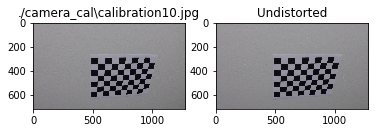

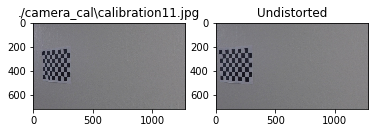

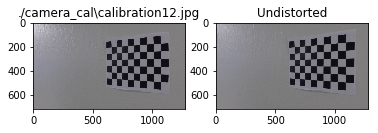

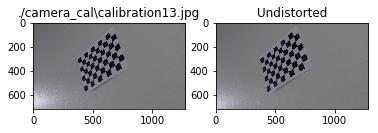

...

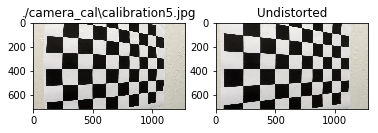

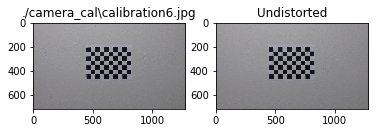

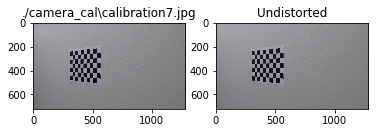

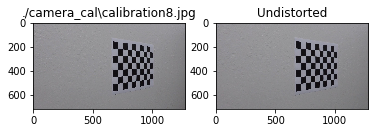

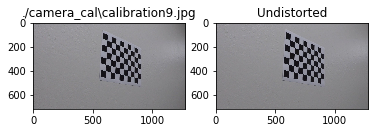

In [7]:
for fname in fnames_cb_images:
    img = mpimg.imread(fname)
    img_undist = undistort(img, objpoints_cb, imgpoints_cb, display=True)

I run the same calibration in six test images of the road.

number of test images =  6


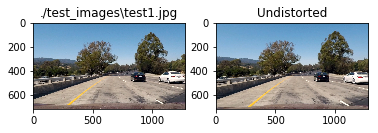

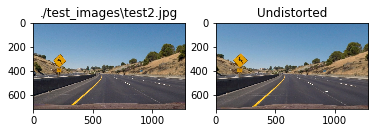

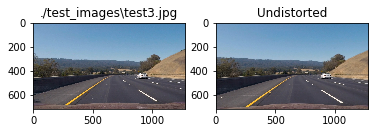

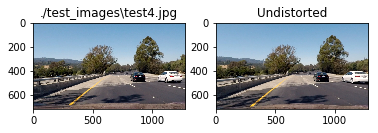

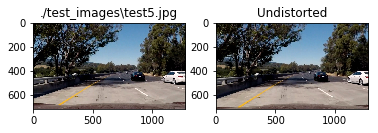

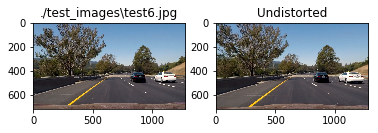

In [8]:
fnames_test_images = glob.glob('./test_images/test*.jpg')
print('number of test images = ',len(fnames_test_images))

images_test=[]
images_test_undistort=[]
for fname in fnames_test_images:
    img = mpimg.imread(fname)    
    images_test.append(img)
    img_undistort = undistort(img, objpoints_cb, imgpoints_cb, display=True)
    images_test_undistort.append(img_undistort)

# 3 Gradient and color transforms

I applied gradient and color transforms on the undistorted images to better capture the lanes.

In [9]:
# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

In [10]:
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

In [11]:
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Define a function to threshold an image for a given range and Sobel kernel
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output    

In [12]:
def color_threshold_old(img, r_thresh=150, g_thresh=150, s_thresh=(50,200), l_thresh=(50,200)):
    # R&G thresholds to help detect yellow lanes
    R = img[:,:,0]
    G = img[:,:,1]
    rg_condition =(R > r_thresh) & (G > g_thresh)

    # color channel thresholds
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    L = hls[:,:,1]
    
    s_condition = (S>s_thresh[0]) & (S<=s_thresh[1])
    l_condition = (L>l_thresh[0]) & (L<=l_thresh[1])
    
    color_output = np.zeros_like(R)
    color_output[(rg_condition & l_condition) & s_condition] = 1
    
    return color_output

In [13]:
def rg_threshold(img, r_thresh=150, g_thresh=150):
    # R&G thresholds to help detect yellow lanes
    R = img[:,:,0]
    G = img[:,:,1]
    rg_condition =(R > r_thresh) & (G > g_thresh)

    rg_output = np.zeros_like(R)
    rg_output[(rg_condition)] = 1
    
    return rg_output

In [14]:
def hls_threshold(img, h_thresh=(50,200), l_thresh=(50,200), s_thresh=(50,200), display=False):
    # color channels of HLS
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]

    h_condition = (hls[:,:,0]>h_thresh[0]) & (hls[:,:,0]<=h_thresh[1])
    l_condition = (hls[:,:,1]>l_thresh[0]) & (hls[:,:,1]<=l_thresh[1])
    s_condition = (hls[:,:,2]>s_thresh[0]) & (hls[:,:,2]<=s_thresh[1])
    
    hls_output = np.zeros_like(hls[:,:,0])
    hls_output[(h_condition) & (l_condition) & (s_condition)] = 1
    
    if display==True:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 6))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image')
        ax2.imshow(hls_output)
        ax2.set_title('hls Image')

    return hls_output


I tested many different threshold values of each grandient and color transformations and also tested different combinations to come up with the best transformations.

In [15]:
def test_diff_transformations(image, display=True):
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=15, thresh_min=30, thresh_max=100)
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=7, thresh_min=50, thresh_max=100)
    mag_binary = mag_thresh(image, sobel_kernel=15, mag_thresh=(60, 250))
    dir_binary = dir_threshold(image, sobel_kernel=7, thresh=(np.pi/6, np.pi/3))
    #color_trans = color_threshold(image, r_thresh=150, g_thresh=150,  \
    #                              s_thresh=(100,225), l_thresh=(100,225))
    rg_trans = rg_threshold(image, r_thresh=150, g_thresh=150) 
    hls_yellow = hls_threshold(img, h_thresh=(15,35), l_thresh=(30,200),  \
                                              s_thresh=(115,255))
    hls_white = hls_threshold(img, h_thresh=(0,255), l_thresh=(200,255),  \
                                              s_thresh=(0,255))

    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh_min=30, thresh_max=120)
    combo1 = np.zeros_like(dir_binary)
    combo1[( ((hls_yellow==1)|(hls_white==1)) | (gradx==1) )] = 1

    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh_min=30, thresh_max=250)
    combo2 = np.zeros_like(dir_binary)
    combo2[( (rg_trans==1) & (((hls_yellow==1)|(hls_white==1))) | (gradx==1) )] = 1

    rg_trans = rg_threshold(image, r_thresh=100, g_thresh=100) 
    combo3 = np.zeros_like(dir_binary)
    combo3[( (rg_trans==1) )] = 1
    
    if display==True:        
        f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 20))
        f.tight_layout()
        ax1.imshow(image)
        ax1.set_title('Original Image')
        ax2.imshow(combo1, cmap='gray')
        ax2.set_title('combo1')
        ax3.imshow(combo2, cmap='gray')
        ax3.set_title('combo2')
        ax4.imshow(combo3, cmap='gray')
        ax4.set_title('combo3')
        
    return None

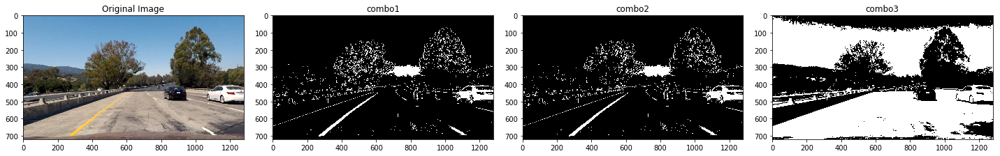

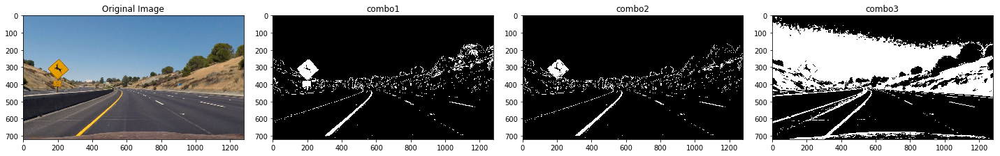

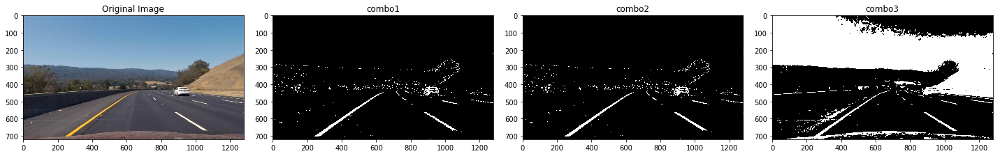

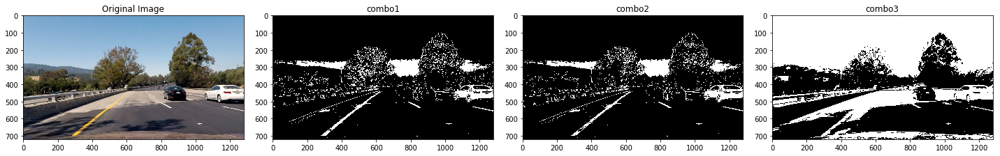

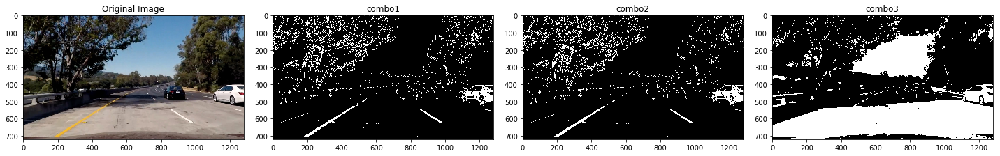

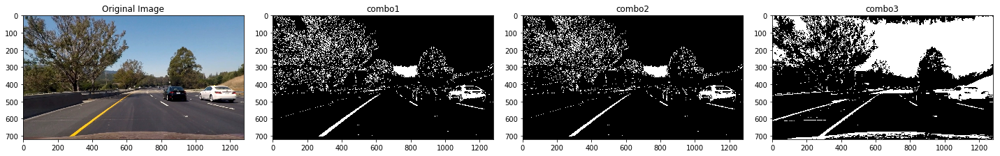

In [16]:
for img in images_test_undistort:
    test_diff_transformations(img, display=True)

At the end, I decided to use the HLS transformation to detect yellow and white lanes and comebine with sobel gradient transformation in X direction and direction gradient transformations.

In [17]:
def grad_color_transform(image, display=True):
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=15, thresh_min=30, thresh_max=130)
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=7, thresh_min=50, thresh_max=100)
    mag_binary = mag_thresh(image, sobel_kernel=15, mag_thresh=(60, 250))
    dir_binary = dir_threshold(image, sobel_kernel=7, thresh=(np.pi/6, np.pi/3))
    #color_trans = color_threshold(image, r_thresh=150, g_thresh=150,  \
    #                              s_thresh=(100,225), l_thresh=(100,225))
    rg_trans = rg_threshold(image, r_thresh=150, g_thresh=150) 
    hls_yellow = hls_threshold(image, h_thresh=(15,35), l_thresh=(30,200),  \
                                              s_thresh=(115,255))
    hls_white = hls_threshold(image, h_thresh=(0,255), l_thresh=(200,255),  \
                                              s_thresh=(0,255))

    combined = np.zeros_like(dir_binary)
#    combined[( ((hls_yellow==1)|(hls_white==1)) | (gradx==1) )] = 1
    
#    combined[((gradx==1)&(dir_binary==1)) | (rg_trans==1) | ((hls_yellow==1)|(hls_white==1))] = 1
    combined[((gradx==1)&(dir_binary==1)) | ((hls_yellow==1)|(hls_white==1))] = 1
    
    
    # apply the region of interest mask
#    mask = np.zeros_like(combined)
#    height, width = combined.shape
#    region_of_interest_vertices = np.array([[0,height-1], [width/2, int(0.5*height)], [width-1, height-1]], dtype=np.int32)
#    cv2.fillPoly(mask, [region_of_interest_vertices], 1)
#    combined = cv2.bitwise_and(combined, mask)

    

    if display==True:        
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 15))
        f.tight_layout()
        ax1.imshow(image)
        ax1.set_title('input image')
        ax2.imshow(combined, cmap='gray')
        ax2.set_title('grad and color transform')
    
    return combined

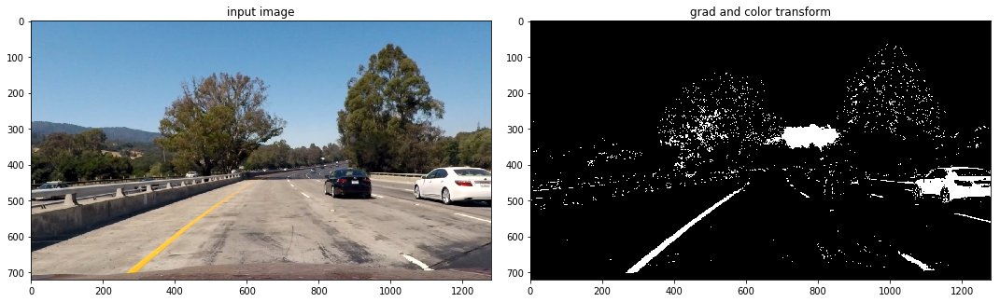

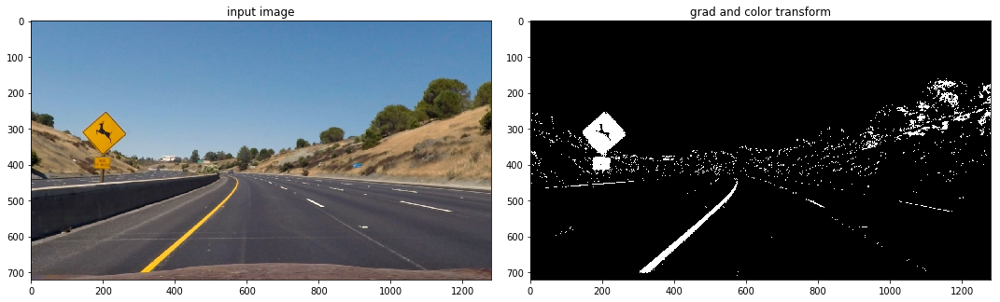

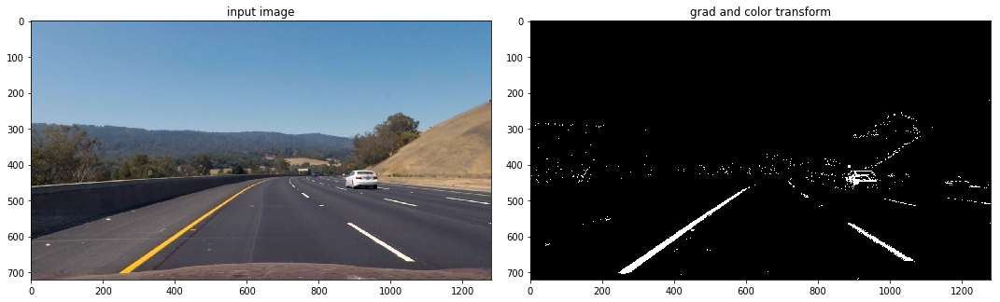

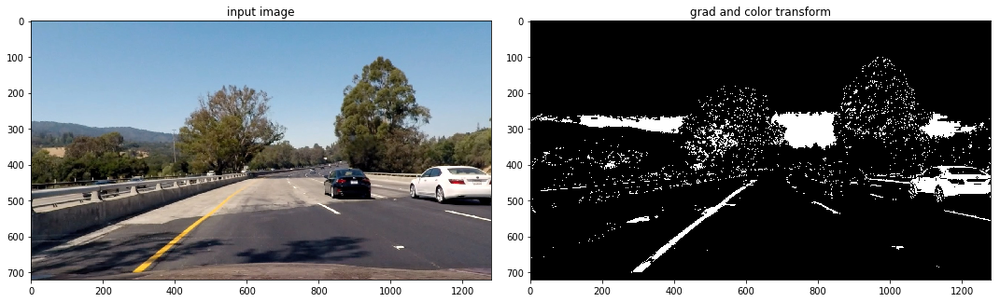

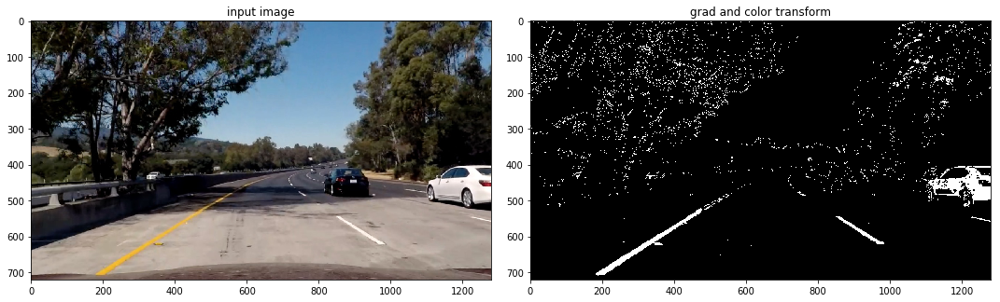

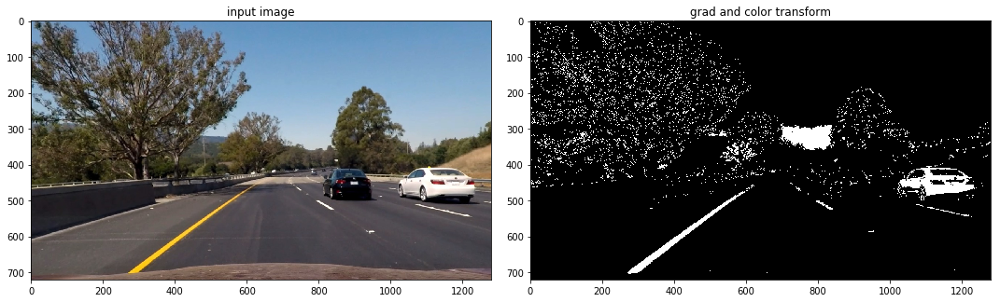

In [18]:
for img_undistort in images_test_undistort:
    img_tr = grad_color_transform(img_undistort, display=True)

# Perform perspective transform

In [19]:
# Perform perspective transform
def persp_transform(img, display=True):
    
#    img_size = (img.shape[1], img.shape[0])

    src_lt=[590, 450]
    src_rt=[720, 450]
    src_rb=[1150, 720]
    src_lb=[250, 720]
    src_region=np.array([src_lt,src_rt,src_rb,src_lb])
    src_region = src_region.reshape((-1,1,2))
    img_lined = img.copy()
    cv2.polylines(img_lined,[src_region],True,(255,0,0), thickness=2)
    
    dst_lt=[200, 50]
    dst_rt=[1080, 50]
    dst_lb=[200, 720]
    dst_rb=[1080, 720]

    src = np.float32([src_lt,src_rt,src_rb,src_lb])
    dst = np.float32([dst_lt,dst_rt,dst_rb,dst_lb])
    M = cv2.getPerspectiveTransform(src, dst)
    M_inv = cv2.getPerspectiveTransform(dst, src)
    img_warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    
    if display==True:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 20))
        ax1.imshow(img_lined)
        ax1.set_title('before warped')
        ax2.imshow(img_warped)
        ax2.set_title('after warped')
    
    return img_warped, M, M_inv

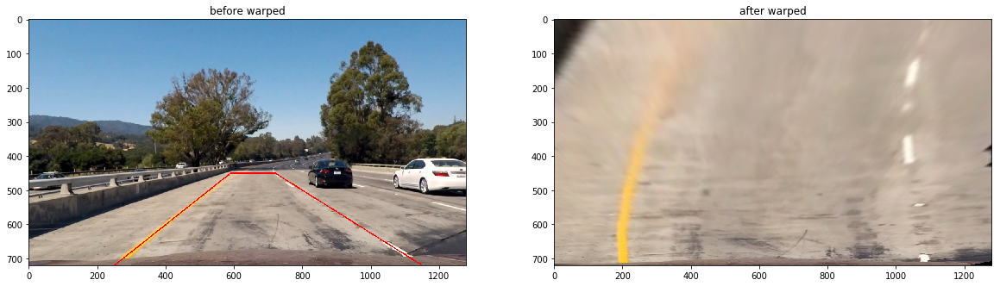

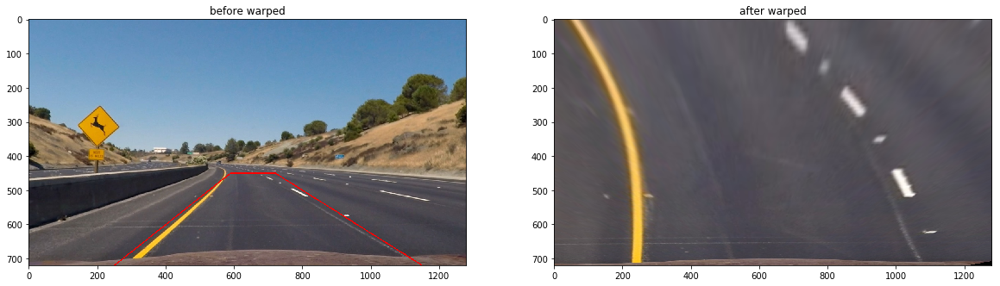

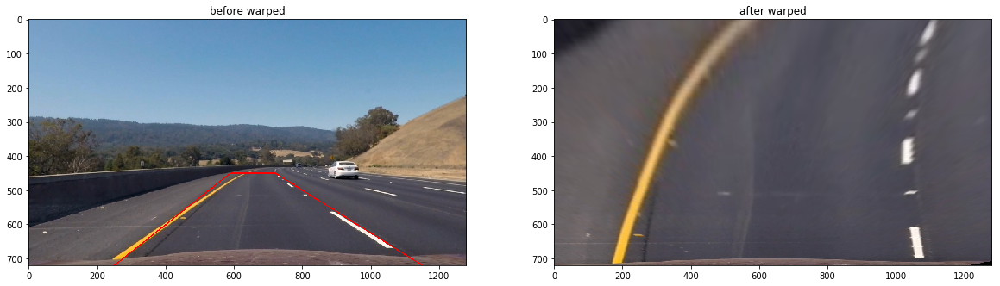

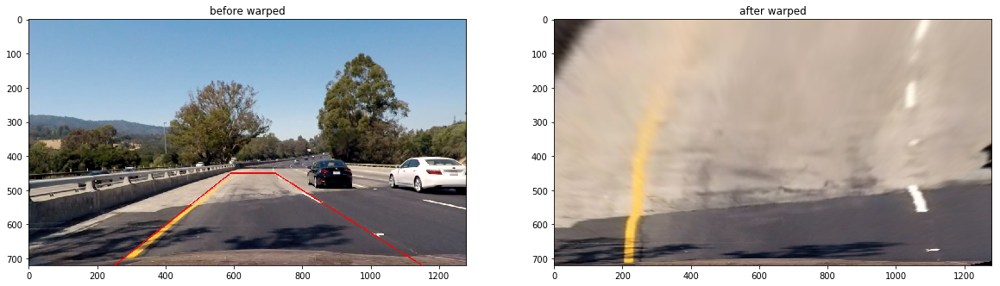

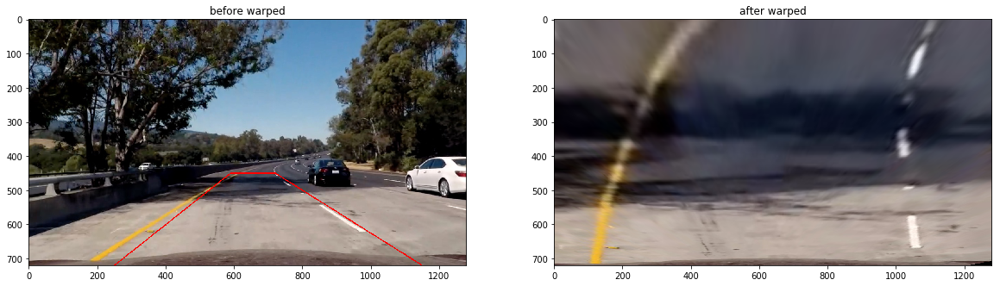

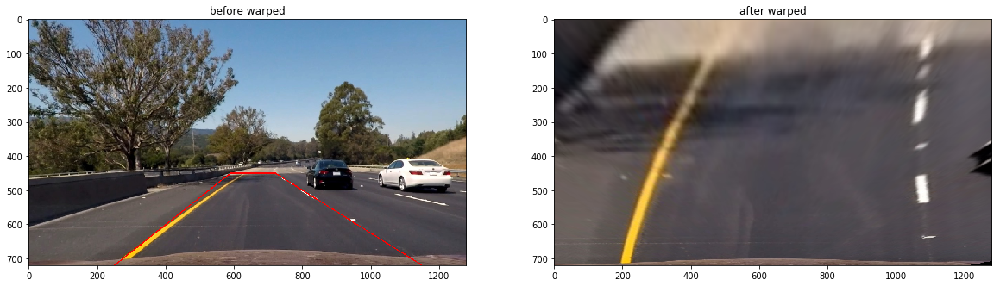

In [20]:
for img in images_test_undistort:
    persp_transform(img, display=True)

As a check, I check a straight road

# Combining transformations
The image to be used will be the combinations of:
* undistorted image
* gradient and color transformations
* perspective transformation



In [21]:
def combine_transformations(img, objpoints_cb, imgpoints_cb, display=True):
    
    img_undistort = undistort(img, objpoints_cb, imgpoints_cb, display=False)
    img_tr = grad_color_transform(img_undistort, display=False)
    img_persp, M, M_inv = persp_transform(img_tr, display=False)
    
    if display==True:
        f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(20, 20))
        ax1.imshow(img_undistort)
        ax1.set_title('undistorted image')
        ax2.imshow(img_tr, cmap='gray')
        ax2.set_title('+ color & grad transform')
        ax3.imshow(img_persp, cmap='gray')
        ax3.set_title('+ persp transform')
        
    return img_persp, M, M_inv

#for fname in fname_test_images:
#    img = undistort(fname, objpoints_cb, imgpoints_cb, display=False)
#    img_tr = grad_color_transform(img, display=True)


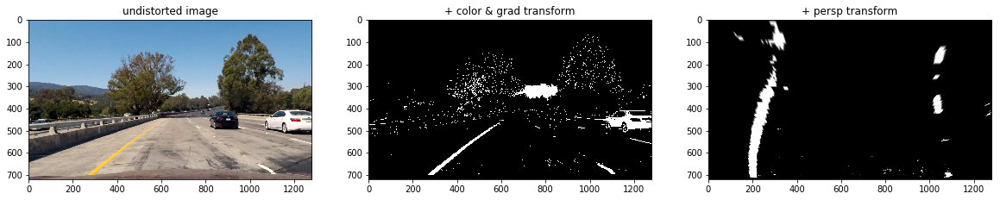

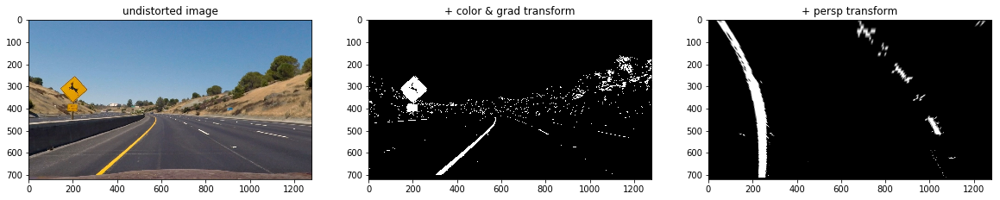

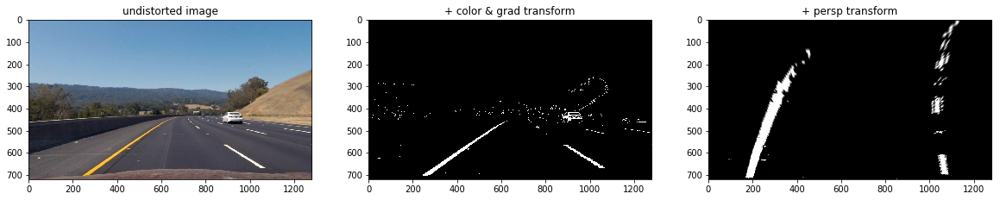

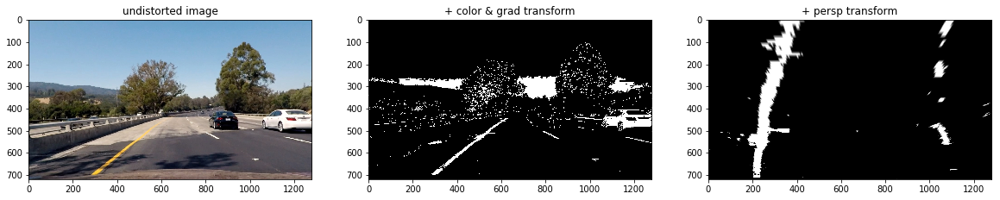

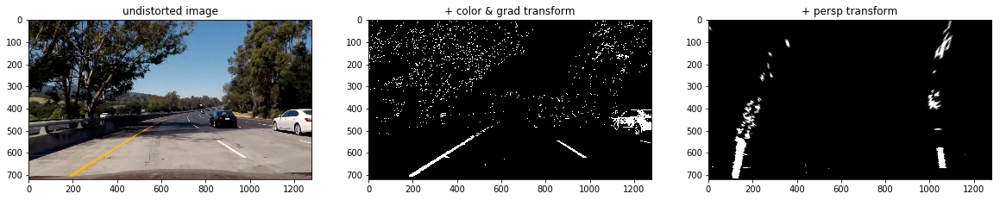

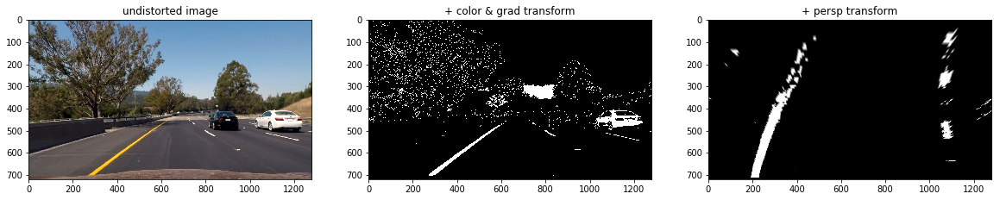

In [22]:
images_binary_warped=[]
M_list=[]
M_inv_list=[]
for img in images_test:
    img_tr, M, M_inv = combine_transformations(img, objpoints_cb, imgpoints_cb, display=True)
    images_binary_warped.append(img_tr)
    M_list.append(M)
    M_inv_list.append(M_inv)
    

# Finding lanes from the image

At this point, left and right lanes will be identified from the transformed images.  Even after the transformations, there are some dots and smudges that are not lanes in the image.

First, we will use the histogram along the columns in the lower half of the image to identify where the lane might be.

In [23]:
def plot_histogram(img, display=True):
    
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)

    x_mid = histogram.shape[0]//2
    x_left = np.argmax(histogram[:x_mid])
    x_right = np.argmax(histogram[x_mid:]) + x_mid
    # print(x_left, x_right)

    if display==True:
        f, (ax1, ax2) = plt.subplots(1,2, figsize=(20, 5))
        # f = plt.figure(figsize=(20,20))
        ax1.imshow(img, cmap='gray')
        ax1.set_title('original image')
        ax2.plot(histogram)
        ax2.set_title('histogram')

    return histogram

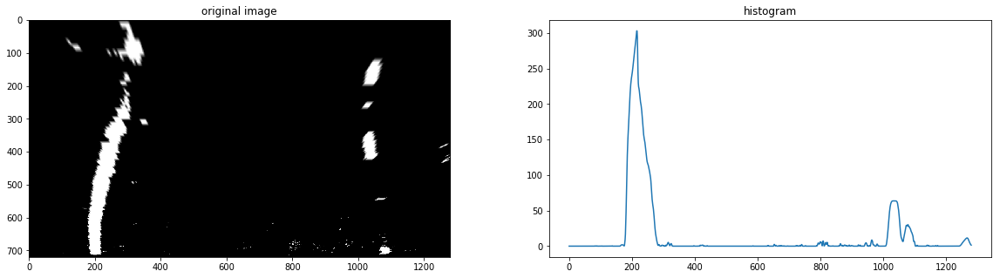

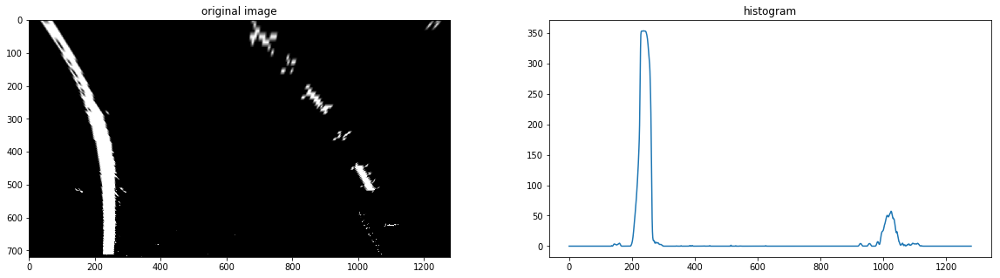

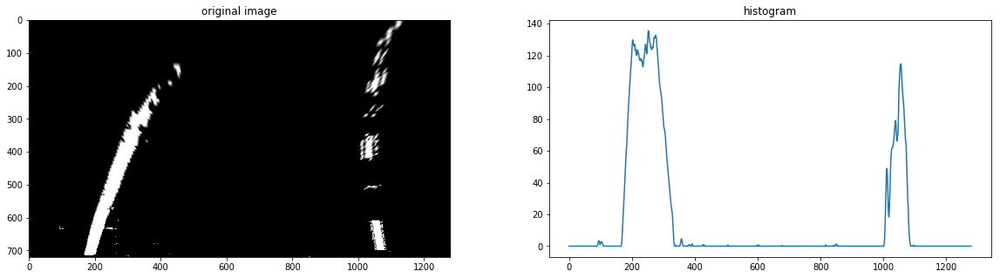

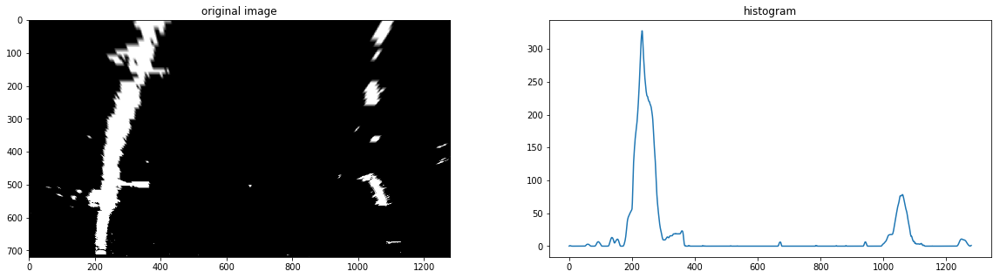

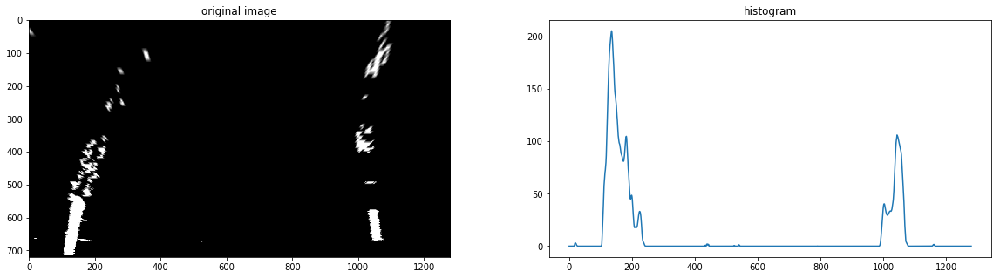

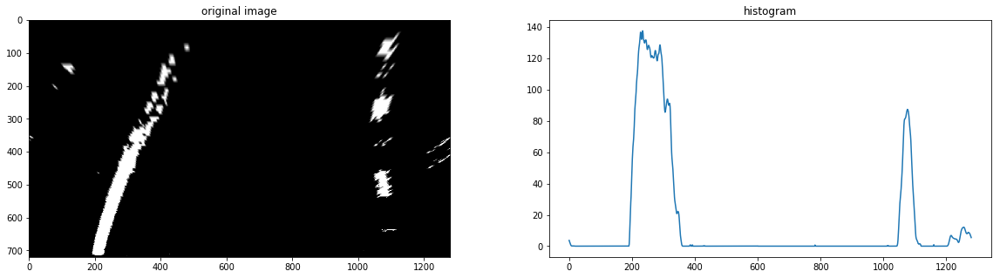

In [24]:
for img in images_binary_warped:
    img_hist = plot_histogram(img, display=True)

Histogram seems to show where the lane might be well.  Next we will add sliding windows to lane locations derived from histogram and fit a polynomial line.

In [25]:
def find_lanes(img, nwindows=9, margin=100, minpix=50, display=True):
    
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)

    #out_img = np.dstack((img, img, img))*255
    out_img = 255*np.dstack((img,img,img)).astype('uint8') 
    
    x_mid = histogram.shape[0]//2
    leftx_base = np.argmax(histogram[:x_mid])
    rightx_base = np.argmax(histogram[x_mid:]) + x_mid
    # print(leftx_base, rightx_base)

    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),[0,255,0], 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),[0,255,0], 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)   

    # left and right predictions using the polynomial values
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]   

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    if display==True:
        f, (ax1, ax2) = plt.subplots(1,2, figsize=(20, 5))
        # f = plt.figure(figsize=(20,20))
        ax1.imshow(img, cmap='gray')
        ax1.set_title('original image')
        ax2.imshow(out_img)
        ax2.plot(left_fitx, ploty, color='yellow')
        ax2.plot(right_fitx, ploty, color='yellow')
        ax2.set_title('finding lane')
        
    return histogram, left_fit, right_fit, left_fitx, right_fitx

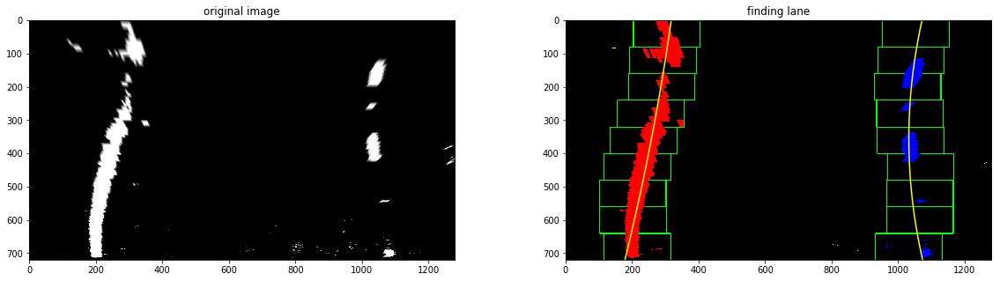

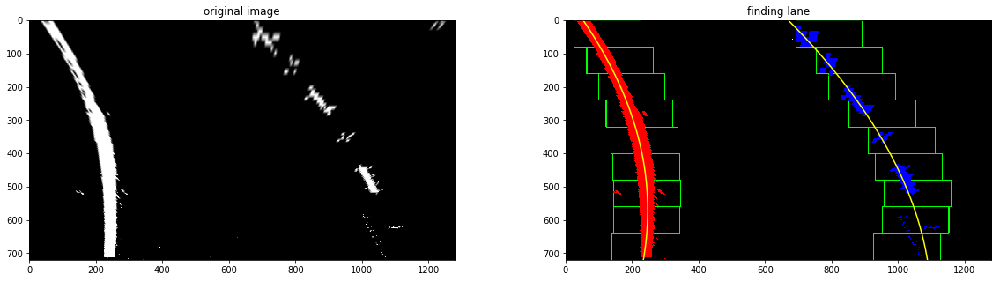

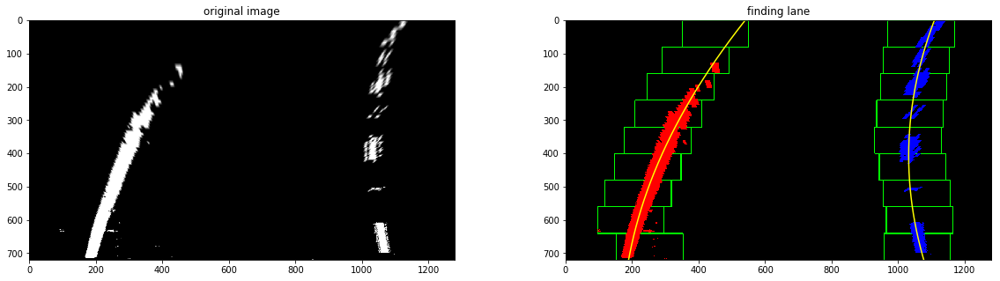

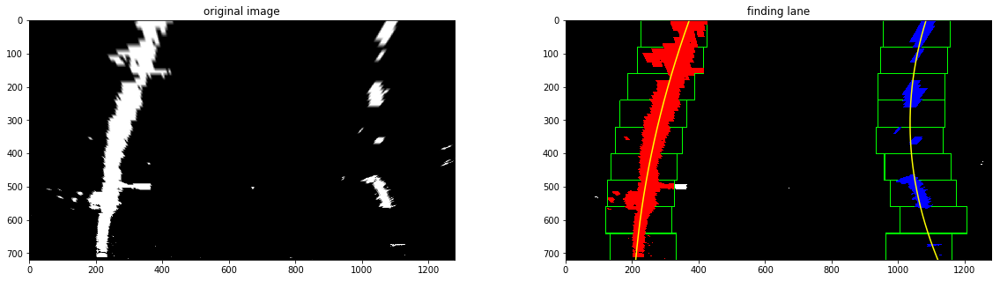

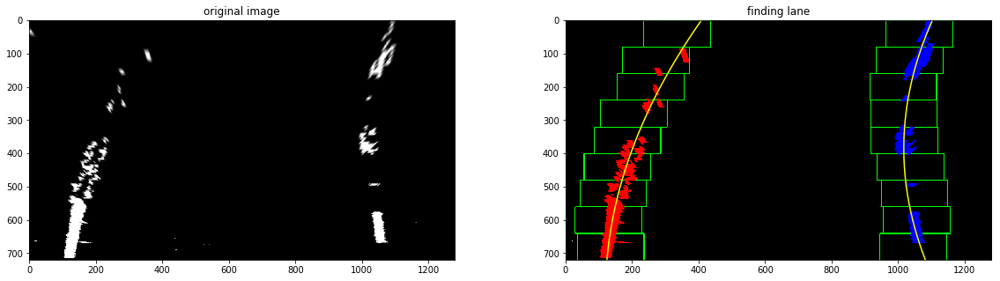

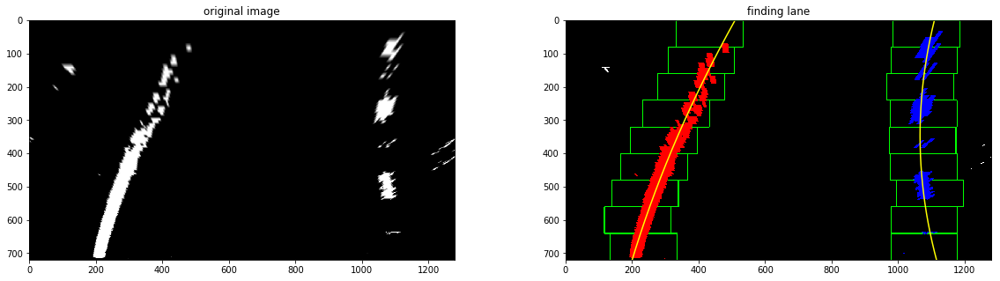

In [26]:
left_fit_array=[]
right_fit_array=[]
for img in images_binary_warped:
    img_hist, lf, rf, lfx, rfx = find_lanes(img, display=True)
    left_fit_array.append(lf)
    right_fit_array.append(rf)

Skip sliding windows once the location of lines are known

In [27]:
# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!

def fit_next_lanes(img, left_fit, right_fit, margin=100, display=True):
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
#    left_fit = np.polyfit(lefty, leftx, 2)
#    right_fit = np.polyfit(righty, rightx, 2)
    
    left_fit_new = np.polyfit(lefty, leftx, 2)
    right_fit_new = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx_orig = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx_orig = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    left_fitx = left_fit_new[0]*ploty**2 + left_fit_new[1]*ploty + left_fit_new[2]
    right_fitx = right_fit_new[0]*ploty**2 + right_fit_new[1]*ploty + right_fit_new[2]

    # Create an image to draw on and an image to show the selection window
    #out_img = np.dstack((img,img,img))*255
    out_img = 255*np.dstack((img,img,img)).astype('uint8') 
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx_orig-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx_orig+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx_orig-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx_orig+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

    if display==True:
        f, (ax1, ax2) = plt.subplots(1,2, figsize=(20, 5))
        # f = plt.figure(figsize=(20,20))
        ax1.imshow(img, cmap='gray')
        ax1.set_title('original image')
        ax2.imshow(result)
        ax2.plot(left_fitx, ploty, color='yellow')
        ax2.plot(right_fitx, ploty, color='yellow')
        ax2.set_title('fit next lane')
    
#    return result, left_fit, right_fit
    return result, left_fit_new, right_fit_new



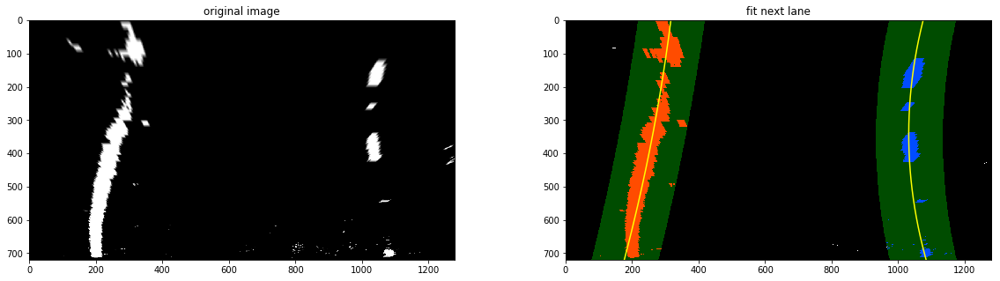

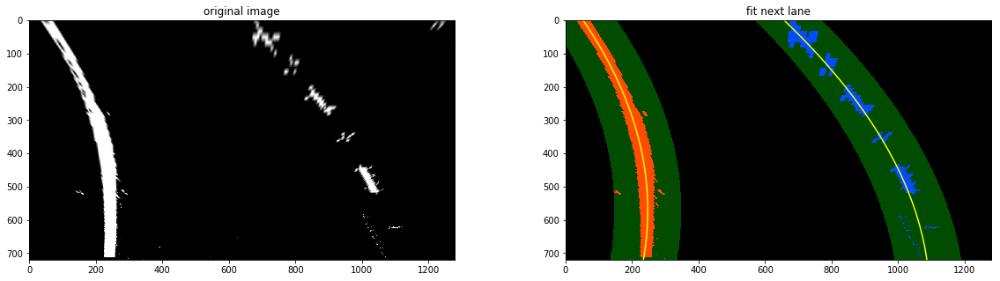

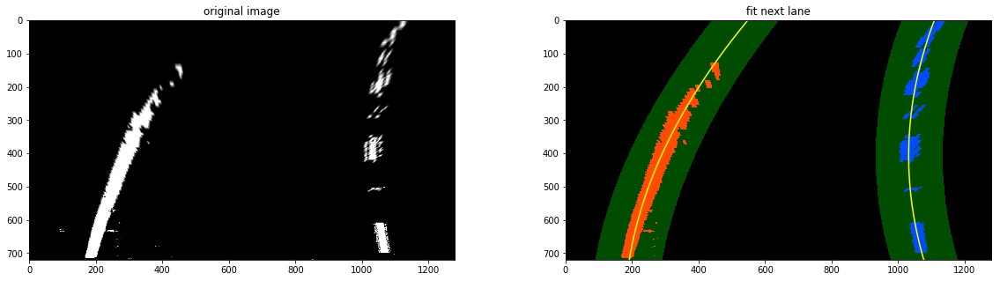

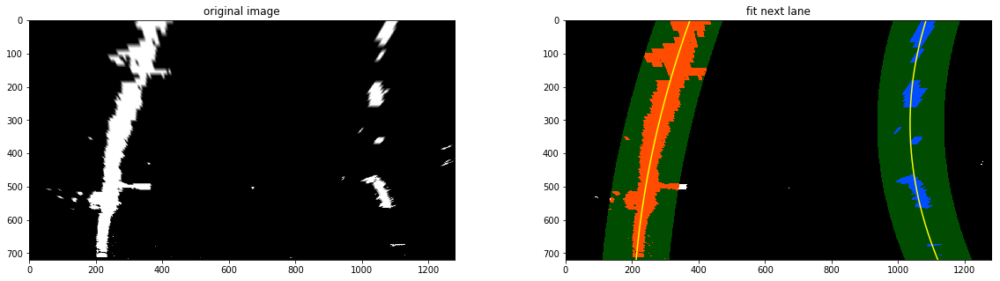

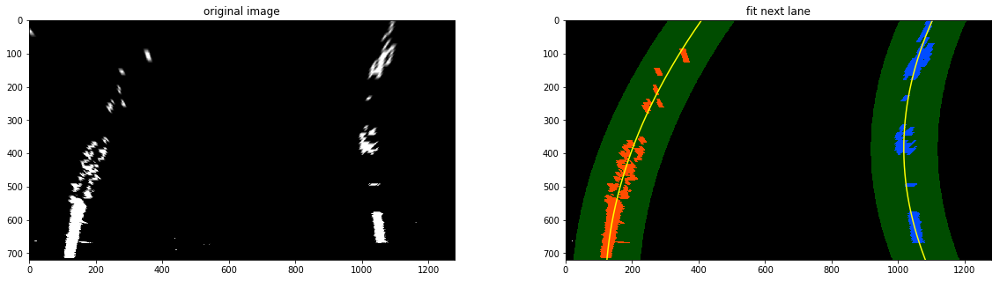

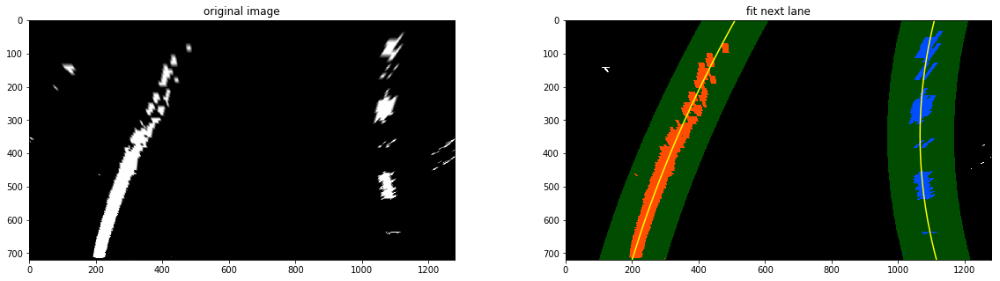

In [28]:
# since we don't have the next image, we are re-using the same binary warped images
for img, left_fit, right_fit in zip(images_binary_warped, left_fit_array, right_fit_array):
    fit_next_lanes(img, left_fit, right_fit, margin=100, display=True)

In [29]:
def measure_curvature(img, left_fitx, right_fitx, ploty, display=True):

    # left and right predictions using the polynomial values
    # computer outside now
    # ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    # left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    # right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
#    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
#    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
#    
#    if display:
#        print('left_curverad, right_curverad ',left_curverad, right_curverad)

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30./720. # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    if display:
        print('left_curverad, right_curverad ',left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    
    return left_curverad, right_curverad

In [30]:
for img, left_fit, right_fit in zip(images_binary_warped, left_fit_array, right_fit_array):
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    measure_curvature(img, left_fitx, right_fitx, ploty, display=True)

left_curverad, right_curverad  2642.16343433 m 2454.56724023 m
left_curverad, right_curverad  5489.56747198 m 4939.59096865 m
left_curverad, right_curverad  3181.8635749 m 3887.3157357 m
left_curverad, right_curverad  1774.41925394 m 4343.50297937 m
left_curverad, right_curverad  3262.38182343 m 5402.23695568 m
left_curverad, right_curverad  1697.57159121 m 2808.66329642 m


# Converting lane information back to the original image
Here we convert the lane information and color it back to the original image.

In [31]:
def fill_orig_image(img_orig, img_warped, left_fit, right_fit, display=True):
    
    img_size = (img_warped.shape[1], img_warped.shape[0])
    
    #out_img = np.dstack((img_warped,img_warped,img_warped))*255
    out_img = 255*np.dstack((img_warped,img_warped,img_warped)).astype('uint8') 
    ploty = np.linspace(0, img_warped.shape[0]-1, img_warped.shape[0] )

    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    left_window = np.array(np.transpose(np.vstack([left_fitx, ploty])))
    right_window = np.array(np.flipud(np.transpose(np.vstack([right_fitx, ploty]))))
    
    lane_region = np.vstack((left_window, right_window))

    cv2.fillPoly(out_img, np.int_([lane_region]), [0,255, 0])

    unwarped = cv2.warpPerspective(out_img, M_inv, img_size, flags=cv2.INTER_LINEAR)
    result = cv2.addWeighted(img_orig, 1, unwarped, 0.3, 0)

    if display:
        plt.figure()
        plt.imshow(result)

    return result

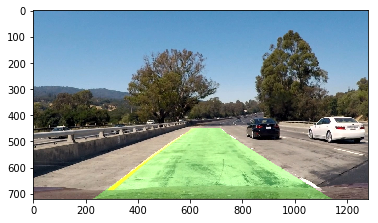

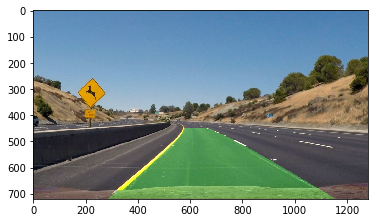

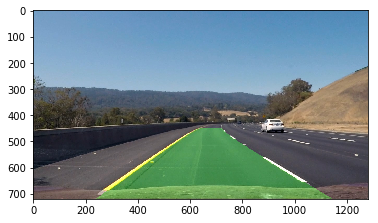

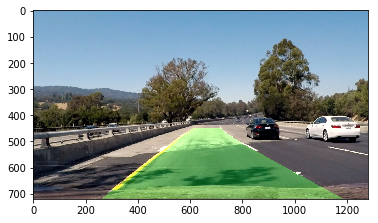

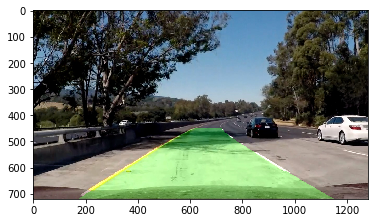

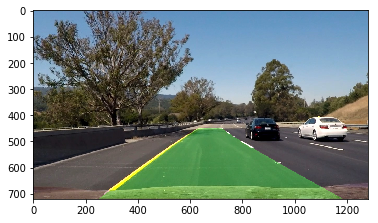

In [32]:
for fname_orig, img_warped, left_fit, right_fit in zip(fnames_test_images, images_binary_warped, left_fit_array, right_fit_array):
    img_orig = mpimg.imread(fname_orig)
    fill_orig_image(img_orig, img_warped, left_fit, right_fit, display=True)

# Pipeline:  readying for video

In [33]:
# global variables
left_fit=None
right_fit=None
left_good_hist = []
right_good_hist = []
mean_diff_prev = -999
frame_count = 0


def get_avg_line(lines_prev, line_new, count = 10):

    num_lines = min(count,len(lines_prev))

    if line_new is None:
        if len(lines_prev)==0:
            return lines_prev, None
        else:
            return lines_prev, lines_prev[-1]
    else:
        
        if num_lines < count:
            lines_prev.append(line_new)
        else:
            lines_prev[0:num_lines-1] = lines_prev[1:num_lines]
            lines_prev[num_lines-1] = line_new
            
            line_new = np.zeros_like(line_new)
            for i in range(num_lines):
                line_new += lines_prev[i]
            line_new /= num_lines
        return lines_prev, line_new
    return None, None
        
#def pipeline_lane_detection(img, display=True):
def pipeline_lane_detection(img, display=False):
    
    global left_fit
    global right_fit
    global left_good_hist
    global right_good_hist
    global mean_diff_prev
    global frame_count
    
    img_size = (img.shape[1],img.shape[0])
    
    img_warped, M, M_inv = combine_transformations(img, objpoints_cb, imgpoints_cb, display=False)

    img_out = 255*np.dstack((img_warped,img_warped,img_warped))
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )

    # use sliding window method if there is no polyfit values
    if (left_fit is None) or (right_fit is None):
        calcfit = True
        img_histogram, left_fit, right_fit, left_fitx, right_fitx = find_lanes(img_warped, display=False)
    # fit lanes from previous polyfit values if there is polyfit values
    else:
        calcfit = False
        img_line, left_fit, right_fit = fit_next_lanes(img_warped, left_fit, right_fit, margin=100, display=False)
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
    # if mean diff of right and left x are in 0.7 to 1.3 range of prev diff, its ok
    # otherwise, if mean diff was derived from previous frame, use sliding window method to re-estimate
    bad_lines = False
    if (left_fitx is None or right_fitx is None):
        bad_lines = True
    else:
        mean_diff = np.mean(right_fitx - left_fitx)
        if mean_diff_prev==-999:
            mean_diff_prev = mean_diff
        elif (mean_diff<0.7*mean_diff_prev or mean_diff>1.3*mean_diff_prev):
            bad_lines = True
            if not calcfit:
                img_histogram, left_fit, right_fit, left_fitx, right_fitx = find_lanes(img_tr, display=False)
                if (left_fitx is None or right_fitx is None):
                    bad_lines = True
                else:
                    mean_diff = np.mean(right_fitx - left_fitx)
                    if (mean_diff<0.7*mean_diff_prev or mean_diff>1.3*mean_diff_prev):
                        bad_lines = True
                    else:
                        bad_lines = False
        else:
            bad_lines = False

    # if lines are bad and there is no history of lines, return image
    # if lines are bad and there is a history, use the previous good history
    # if lines are good, average with previous lines for smoother transitions
    if bad_lines:
        left_fit = None
        right_fit = None
        if len(left_good_hist)==0 and len(right_good_hist)==0:
            return img
        else:
            left_fitx = left_good_hist[-1]
            right_fitx = right_good_hist[-1]
    else:
        left_good_hist, left_fitx = get_avg_line(left_good_hist, left_fitx, count = 10)
        right_good_hist, right_fitx = get_avg_line(right_good_hist, right_fitx, count = 10)
        mean_diff = np.mean(right_fitx - left_fitx)
        mean_diff_prev = 0.9*mean_diff_prev + 0.1*mean_diff

    # compute the radius of curvature
    left_curve_rad, right_curve_rad = measure_curvature(img, left_fitx, right_fitx, ploty, display=False)
    average_curve_rad = (left_curve_rad + right_curve_rad)/2
    curvature_string = "Radius of curvature: %.2f m" % average_curve_rad
    
    # compute the offset from the center
    lane_center = (right_fitx[img_warped.shape[0]-1] + left_fitx[img_warped.shape[0]-1])/2
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    center_offset_pixels = abs(img_size[0]/2 - lane_center)
    center_offset_mtrs = xm_per_pix*center_offset_pixels
    offset_string = 'distance off from center: %.2f m' % center_offset_mtrs
    mean_diff_string = 'mean diff: %.2f ' % mean_diff
    
    result = fill_orig_image(img, img_warped, left_fit, right_fit, display=False)
    
    cv2.putText(result,curvature_string , (100, 90), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)
    cv2.putText(result, offset_string, (100, 150), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)

    if display:
        f, (ax1, ax2) = plt.subplots(1,2, figsize=(20, 5))
        ax1.imshow(img)
        ax1.set_title('original image')
        ax2.imshow(result)
        ax2.set_title('lane found image')
    
    return result    
    

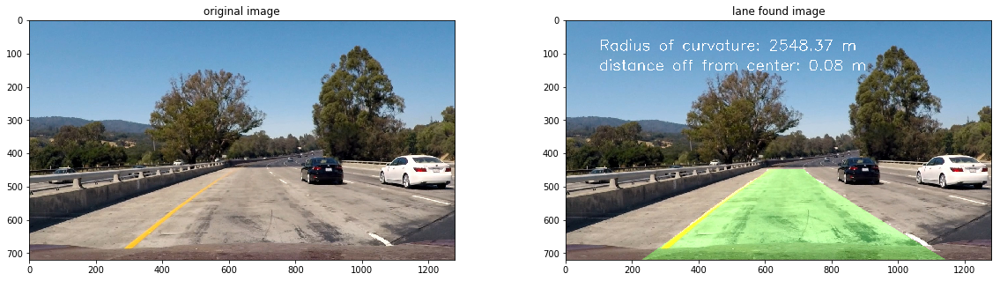

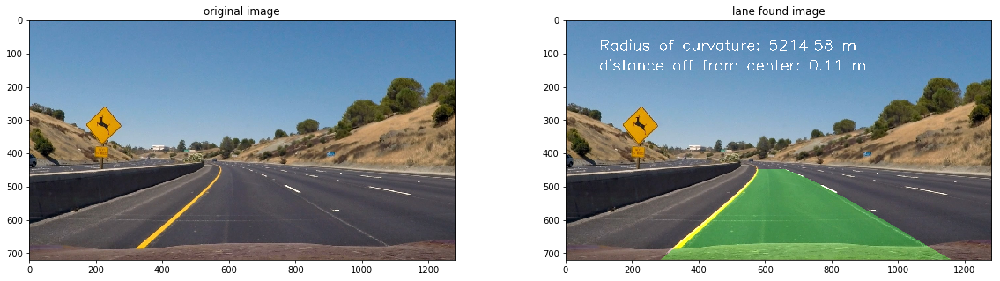

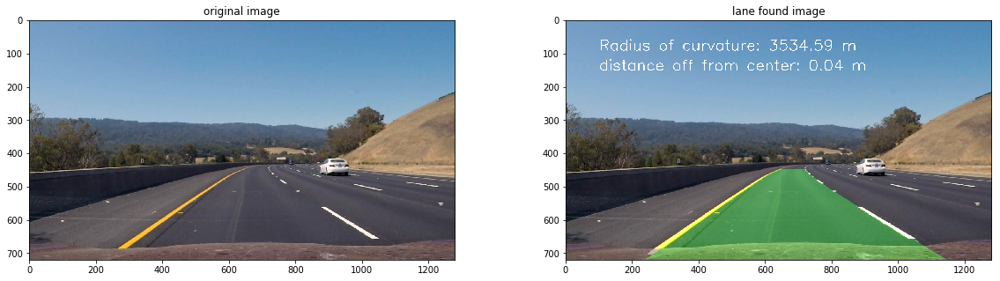

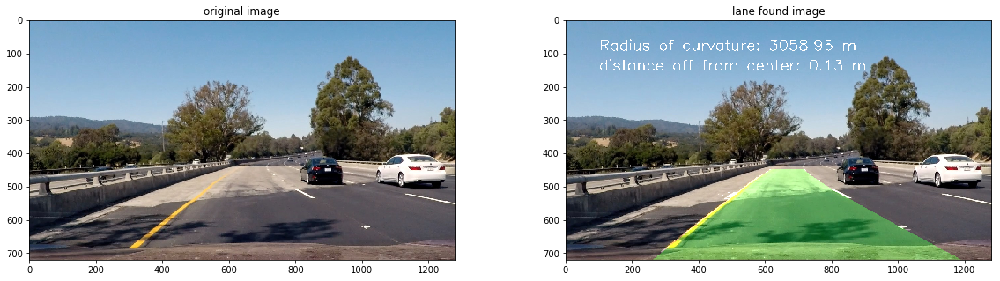

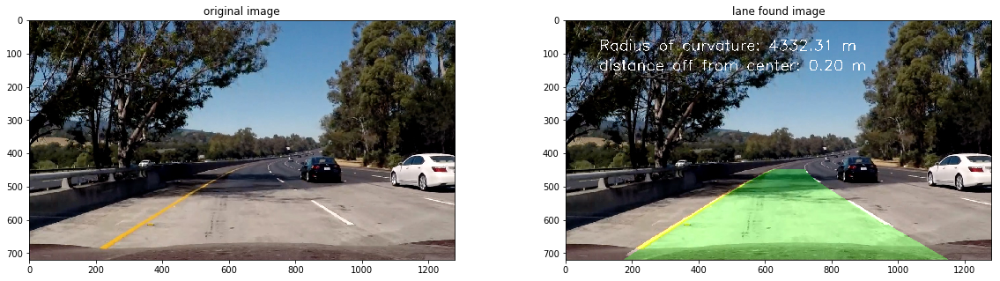

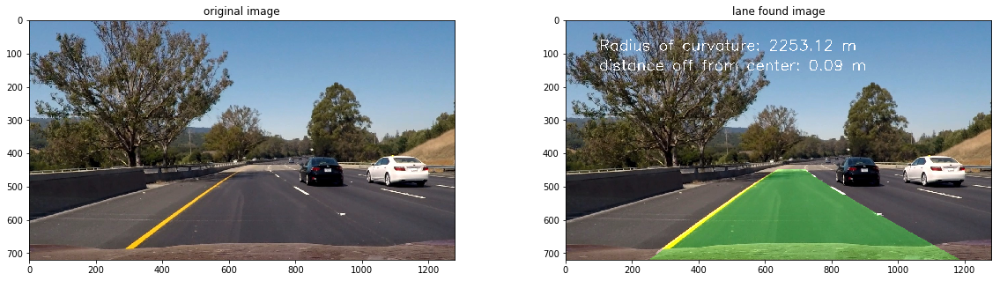

In [34]:
for img in images_test:
    left_fit=None
    right_fit=None
    left_good_hist = []
    right_good_hist = []
    mean_diff_prev = -999
    frame_count = 0

    tmp_del = pipeline_lane_detection(img, display=True)

# Running with the video

In [35]:
from moviepy.editor import VideoFileClip
#from IPython.display import HTML

In [36]:
left_fit=None
right_fit=None
left_good_hist = []
right_good_hist = []
mean_diff_prev = -999
frame_count=0

out_video = 'project_video_output.mp4'
in_video = VideoFileClip("project_video.mp4")
#in_video = VideoFileClip("subclip_5_8.mp4")
white_clip = in_video.fl_image(pipeline_lane_detection) 
%time white_clip.write_videofile(out_video, audio=False)


[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████████████████████████████████▉| 1260/1261 [27:21<00:01,  1.31s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 27min 22s
